In [1]:
import csv
import torch
import torch.nn as nn
import numpy as np
import random                                                                  
import matplotlib.pyplot as plt
torch.backends.cudnn.deterministic=True
from torch.nn import functional as F
import torch.optim as optim
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
import math
from torch.autograd import grad
from Libraries import robotarm as ra
from Libraries import ICNN_net_SE3 as net
from Libraries import ICNN_plot as pl
from Libraries import ICNN_optim_v2 as opt
dtype = torch.float
device_c = torch.device("cpu")
device = torch.device("cuda:0")

tensor([[0.0157, 0.9558],
        [0.0157, 0.9646],
        [0.0157, 0.9724],
        [0.0157, 0.9792],
        [0.0157, 0.9851],
        [0.0157, 0.9900],
        [0.0157, 0.9940],
        [0.0157, 0.9969],
        [0.0157, 0.9989],
        [0.0157, 0.9999]])

In [135]:
#X = torch.randn([10,6],dtype=dtype,device=device,requires_grad = True)
X = X-2*np.pi
theta = X[:,:3] 
b = X[:,3:]
theta_squared = theta**2
theta_norm = theta_squared[:,0]+theta_squared[:,1]#+theta_squared[:,2]
#theta_periodic1 = torch.zeros(30,dtype=dtype,device=device,requires_grad = True)
theta_periodic10 =  (torch.sin(theta_norm)/theta_norm*theta[:,0]).view(-1,1)
theta_periodic11 =  (torch.sin(theta_norm)/theta_norm*theta[:,1]).view(-1,1)
theta_periodic12 =  (torch.sin(theta_norm)/theta_norm*theta[:,2]).view(-1,1)
#theta_periodic1 = torch.cat((theta_periodic10,theta_periodic11,theta_periodic12),dim=1)
theta_periodic20 = ((1-torch.cos(theta_norm))/theta_norm*(theta[:,0]**2)).view(-1,1)
theta_periodic21 = ((1-torch.cos(theta_norm))/theta_norm*(theta[:,1]**2)).view(-1,1)
theta_periodic22 = ((1-torch.cos(theta_norm))/theta_norm*(theta[:,2]**2)).view(-1,1)
#theta_periodic2 = torch.cat((theta_periodic20,theta_periodic21,theta_periodic22),dim=1)
theta_periodic = torch.cat((theta_periodic10,theta_periodic11,theta_periodic12,theta_periodic20,theta_periodic21,theta_periodic22),dim=1)

In [132]:
def h_2d(X):
        theta = X[:,:2] 
        #b = X[:,3:]
        theta_squared = theta**2
        theta_norm = theta_squared[:,0]+theta_squared[:,1]
        theta_periodic10 =  (torch.sin(theta_norm)/theta_norm*theta[:,0]).view(-1,1)
        theta_periodic11 =  (torch.sin(theta_norm)/theta_norm*theta[:,1]).view(-1,1)
        #theta_periodic12 =  (torch.sin(theta_norm)/theta_norm*theta[:,2]).view(-1,1)
        #theta_periodic1 = torch.cat((theta_periodic10,theta_periodic11,theta_periodic12),dim=1)
        theta_periodic20 = ((1-torch.cos(theta_norm))/theta_norm*(theta[:,0]**2)).view(-1,1)
        theta_periodic21 = ((1-torch.cos(theta_norm))/theta_norm*(theta[:,1]**2)).view(-1,1)
        #theta_periodic22 = ((1-torch.cos(theta_norm))/theta_norm*(theta[:,2]**2)).view(-1,1)
        #theta_periodic2 = torch.cat((theta_periodic20,theta_periodic21,theta_periodic22),dim=1)
        theta_periodic= torch.cat((theta_periodic10,theta_periodic11,
               theta_periodic20,theta_periodic21),dim=1)
        #X_se3 = torch.cat((theta_periodic,b))
        return theta_periodic

In [133]:
h_2d(Xstable.view(-1,2))

tensor([[0.0458, 0.1636, 0.0075, 0.0951]], device='cuda:0')

In [119]:
X, theta_periodic

(tensor([[ 0.5330, -0.8797, -0.0664, -0.3353,  1.3505, -0.6069],
         [-0.0207,  0.5431, -0.4424, -1.4324, -1.1148,  0.2616],
         [-0.6299,  1.9483,  0.1917,  0.6243, -0.0528, -1.2338],
         [-0.0801, -0.2761, -0.1069, -0.3447, -1.4360,  1.5665],
         [-0.7682,  0.7962, -1.3821,  0.5000,  0.4620, -1.0674],
         [ 0.9863, -1.7955, -1.3315,  0.7370,  1.1843,  0.8513],
         [-0.7723,  0.3720, -1.1069,  0.6881, -1.1205,  1.3206],
         [-1.1803,  0.5044, -0.3561, -0.1194,  0.2909, -1.7036],
         [-0.3297, -0.9289, -0.1661, -0.1769,  0.2348, -0.2326],
         [ 0.9524,  1.1372, -0.0615,  0.1711,  0.0617,  0.8979]],
        device='cuda:0', grad_fn=<SubBackward0>),
 tensor([[ 4.3827e-01, -7.2330e-01, -5.4631e-02,  1.3724e-01,  3.7379e-01,
           2.1324e-03],
         [-1.9866e-02,  5.2151e-01, -4.2486e-01,  1.0300e-04,  7.0977e-02,
           4.7107e-02],
         [ 1.3188e-01, -4.0794e-01, -4.0137e-02,  1.3738e-01,  1.3145e+00,
           1.2725e-02],
  

In [86]:
a=torch.sin(theta_norm)/theta_norm*theta[:,0]
b= torch.sin(theta_norm)/theta_norm*theta[:,1]
c = torch.cat(a,b,0)

TypeError: cat() received an invalid combination of arguments - got (Tensor, Tensor, int), but expected one of:
 * (tuple of Tensors tensors, name dim, Tensor out)
      didn't match because some of the arguments have invalid types: (!Tensor!, !Tensor!, !int!)
 * (tuple of Tensors tensors, int dim, Tensor out)
      didn't match because some of the arguments have invalid types: (!Tensor!, !Tensor!, !int!)


In [92]:
a = a.view(10,1)
b = b.view(10,1)

In [98]:
torch.cat((a,b,a),dim=1),a,b

(tensor([[ 0.3180,  0.1042,  0.3180],
         [ 0.4102,  0.1659,  0.4102],
         [ 0.1425, -0.3093,  0.1425],
         [-0.5074, -0.2126, -0.5074],
         [ 0.6856,  0.3558,  0.6856],
         [ 0.1434,  0.1024,  0.1434],
         [ 0.1882, -0.3322,  0.1882],
         [-0.0656, -0.0749, -0.0656],
         [-0.1025, -0.0680, -0.1025],
         [ 0.3277,  0.1212,  0.3277]], device='cuda:0', grad_fn=<CatBackward>),
 tensor([[ 0.3180],
         [ 0.4102],
         [ 0.1425],
         [-0.5074],
         [ 0.6856],
         [ 0.1434],
         [ 0.1882],
         [-0.0656],
         [-0.1025],
         [ 0.3277]], device='cuda:0', grad_fn=<ViewBackward>),
 tensor([[ 0.1042],
         [ 0.1659],
         [-0.3093],
         [-0.2126],
         [ 0.3558],
         [ 0.1024],
         [-0.3322],
         [-0.0749],
         [-0.0680],
         [ 0.1212]], device='cuda:0', grad_fn=<ViewBackward>))

In [73]:
torch.sin(theta_norm)/theta_norm*theta[:,0]

tensor([ 0.1235,  0.8215,  0.1879,  0.0391, -0.6518,  0.3943,  0.4560, -0.5444,
         0.2388, -0.0362], device='cuda:0', grad_fn=<MulBackward0>)

In [61]:
X.grad

tensor([[-0.3122,  1.3625, -0.6625,  0.0000,  0.0000,  0.0000],
        [-0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [-0.0000,  0.0000, -0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000, -0.0000,  0.0000,  0.0000,  0.0000,  0.0000],
        [-0.0000,  0.0000, -0.0000,  0.0000,  0.0000,  0.0000],
        [ 0.0000,  0.0000, -0.0000,  0.0000,  0.0000,  0.0000]],
       device='cuda:0')

In [2]:
#robot initialize
date = 'Setting15_trial0'

#robot 1
l1 = 0.2
l2 = 0.2
m1 = 2
m2 = 2

#robot 2
#l1 = 0.3
#l2 = 0.2
#m1 = 3
#m2 = 2

#robot 3
#l1 = 0.5
#l2 = 0.2
#m1 = 5 
#m2 = 2

#robot 4
#l1 = 0.2 
#l2 = 0.5
#m1 = 2
#m2 = 5

robot = ra.robotarm(l1,l2,m1,m2,device)
xinit = torch.tensor([[-2],[2]],dtype=dtype)
xfinal = torch.tensor([[3],[3]],dtype=dtype)
T = 3
delta = 0.6
num_timesteps = 100
#setting number 5 약간 꼬불꼬불?
# traj 1
#Vpoints = np.array([  1.5,1.7,1.9,2.3,2.6])
#xpoints = np.array([  0.8,1.8,2.3,1.8,1.3])
#ypoints = np.array([  1.0,1.3,1.6,1.9,2.2])

# traj 2
#Vpoints = np.array([  1.5,1.7,1.9,2.3,2.6])
#xpoints = np.array([  1.5, 1.25,     1.75,   1.25, 1.75, 1.25])
#ypoints = np.array([  1.3,   1.45,  1.6, 1.75, 1.9, 2.2])

# traj 3
#Vpoints = np.array([  1.5,1.7,1.9,2.3,2.6])
#xpoints = np.array([  1.0, 1.5, 2.0, 2.2, 2.5])
#ypoints = np.array([  1.0, 1.5, 2.0, 2.2, 2.5])

# traj 4
#Vpoints = np.array([  1.5,1.7,1.9,2.3,2.6])
#xpoints = np.array([  0.7, 1.5, 1.0, 2.2, 2.5])
#ypoints = np.array([  0.7, 1.0, 1.5, 1.6, 2.5])

# traj 5
Vpoints = np.array([  1.5,1.7,1.9,2.3,2.6])
xpoints = np.array([  2.5, 1.5, 1.0, 1.5, 0.7])
ypoints = np.array([  0.5, 0.9, 1.5, 1.6, 2.5])
#rmin,rmax,qmin,qmax,dt,qinit,qfinal,Xstable,xtraj,x_dot,qtraj,q_dot = robot.Initialize(xinit,xfinal,T,delta,num_timesteps)
rmin,rmax,qmin,qmax,dt,qinit,qfinal,Xstable,xtraj,qtraj,q_dot = robot.Initialize_spline(xpoints,ypoints,Vpoints, T, delta, num_timesteps)

#ICNN initialize
fhat_size = 500
V_size = 300
V_hidden_sizes = [V_size, V_size,V_size]
fhat_hidden_sizes = [fhat_size,fhat_size,fhat_size,fhat_size,fhat_size,fhat_size,fhat_size]
tol = 1#0.01
alpha = 0.1
#getting grid data (for the regularizer)
nq1 = 100 # grid number
nq2 = 100 
nq1_b = 10 # grid number
nq2_b = 10
penalty = 5000
penalty_boundary = 0#100000
alpha_kinematic = 0.01
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T) #qmin, qmax는 위에서 구함
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)
q_in_boundary,q_dot_boundary = optim_.get_boundary(nq1_b,nq2_b,qmin,qmax)
nq1_p = 100
nq2_p = 100
nx1 = 100
nx2 = 100
xmin = [-robot.l1-robot.l2, -robot.l2]
xmax = [robot.l1+robot.l2,robot.l1+robot.l2]

In [3]:
# initialize
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

In [4]:
#no regularizationv
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000)

 epoch = 1002, loss = 0.822994, loss_b = 1.418646, loss_t = 0.822994                    .    .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

KeyboardInterrupt: 

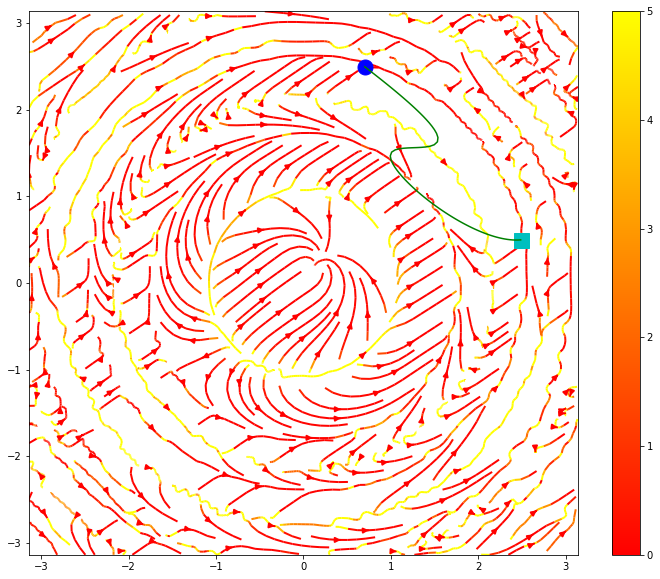

In [4]:
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_wreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)

tensor([-3.0416, -3.0416], device='cuda:0', grad_fn=<SliceBackward>) tensor([0.0559, 0.0559, 0.0298, 0.0298], device='cuda:0',
       grad_fn=<SliceBackward>)
tensor([[0.0117, 0.0073, 0.0118,  ..., 0.0254, 0.0219, 0.0292],
        [0.0067, 0.0111, 0.0157,  ..., 0.0440, 0.0248, 0.0215],
        [0.0103, 0.0148, 0.0141,  ..., 0.0743, 0.0427, 0.0237],
        ...,
        [0.0333, 0.0227, 0.0268,  ..., 0.0078, 0.0079, 0.0110],
        [0.0584, 0.0339, 0.0233,  ..., 0.0085, 0.0117, 0.0113],
        [0.0883, 0.0596, 0.0354,  ..., 0.0125, 0.0120, 0.0080]])


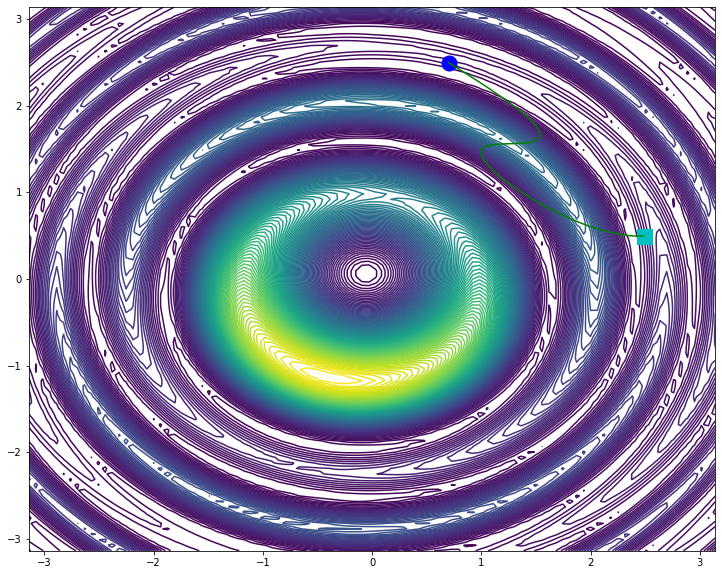

In [5]:
plt_.plot_V('Vplot.png',100)


In [137]:
f = open(date+'_total_data.csv','w', newline='')
wr = csv.writer(f)
wr.writerow(['xpoints'])
wr.writerow(xpoints)
wr.writerow(['ypoints'])
wr.writerow(ypoints)
wr.writerow(['T = ',T])
wr.writerow(['delta = ',delta])
wr.writerow(['num_timesteps = ',num_timesteps])
wr.writerow(['alpha = ',alpha])
wr.writerow(['tol =', tol ])
f.close()

# Ploting trajectory

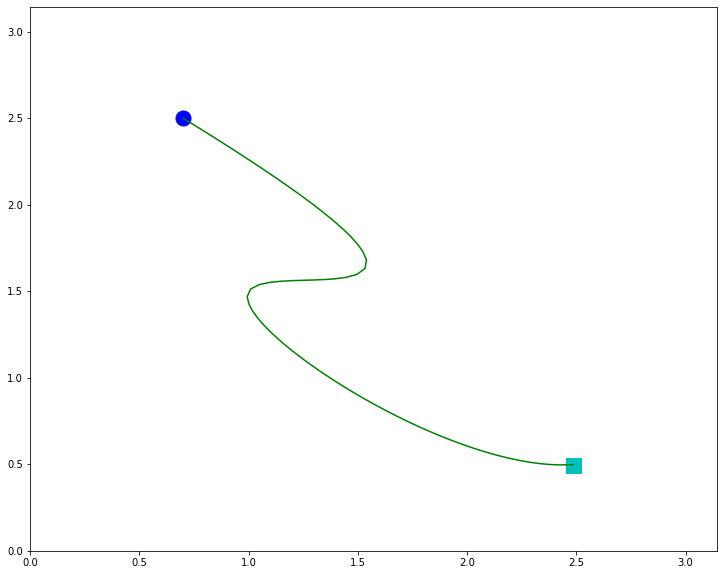

In [3]:
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_q_traj('qtraj.png')

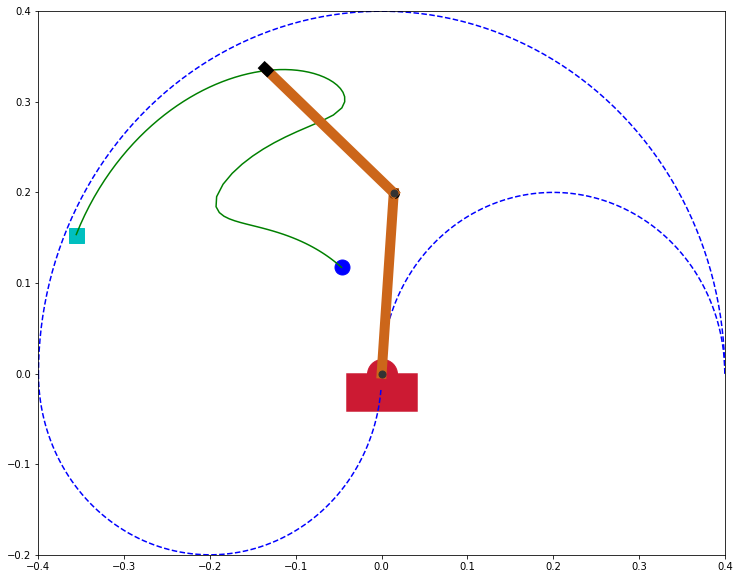

In [4]:
theta1 = xpoints[1]
theta2 = ypoints[1]
plt_.plot_robot_taskspace('robotplot.png', robot,theta1,theta2, traj=True)

In [138]:
# initialize
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000)
loss_traj_1, loss_boundary_1, loss_Euc_1, loss_kinematic_1, loss_kinetic_1 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_1, loss_boundary_1, loss_Euc_1, loss_kinematic_1, loss_kinetic_1)
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['No Regularization'])
wr.writerow(['loss_traj_1', 'loss_boundary_1', 'loss_Euc_1', 'loss_kinematic_1', 'loss_kinetic_1'])
wr.writerow([loss_traj_1.data.to(device_c).numpy(), loss_boundary_1.data.to(device_c).numpy(), loss_Euc_1.data.to(device_c).numpy(), loss_kinematic_1.data.to(device_c).numpy(), loss_kinetic_1.data.to(device_c).numpy()])
f.close()
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_noreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f('fplot_noreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)

 epoch = 1261, loss = 0.15713234, loss_b = 1.9219142, loss_t = 0.15713234                    .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                          

KeyboardInterrupt: 

In [3]:
# initialize
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

 epoch = 10000, loss = 0.00017769104, loss_b = 1.9653239, loss_t = 0.00017769104                    .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

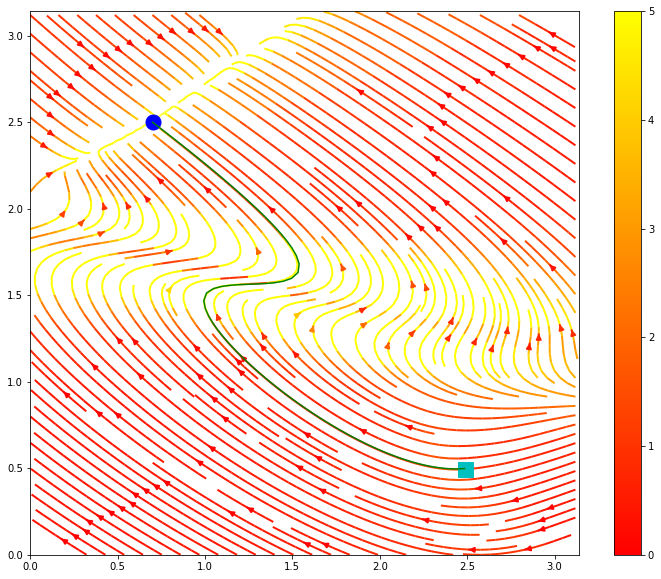

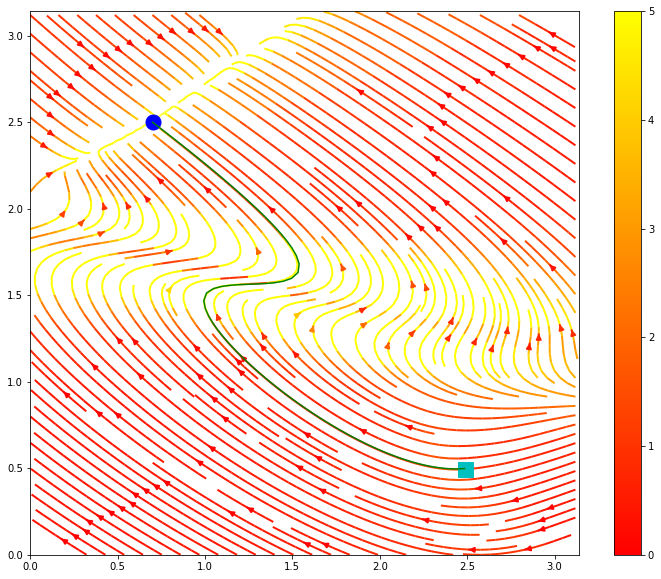

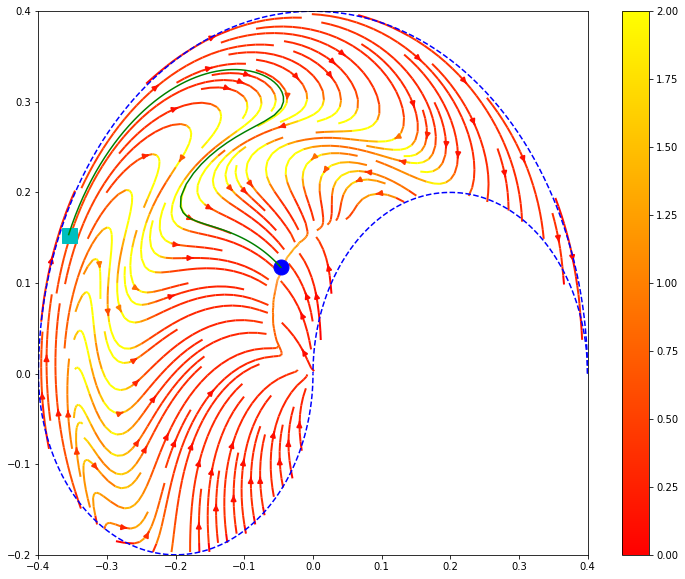

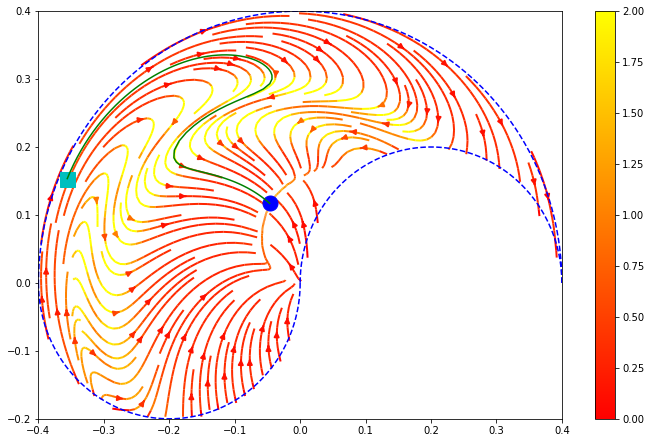

In [10]:
#weight regularization
optim_.optim_weight_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000,weight_decay = 1e-4)
loss_traj_2, loss_boundary_2, loss_Euc_2, loss_kinematic_2, loss_kinetic_2 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_2, loss_boundary_2, loss_Euc_2, loss_kinematic_2, loss_kinetic_2)
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Weight Regularization'])
wr.writerow(['loss_traj_2', 'loss_boundary_2', 'loss_Euc_2', 'loss_kinematic_2', 'loss_kinetic_2'])
wr.writerow([loss_traj_2.data.to(device_c).numpy(), loss_boundary_2.data.to(device_c).numpy(), loss_Euc_2.data.to(device_c).numpy(), loss_kinematic_2.data.to(device_c).numpy(), loss_kinetic_2.data.to(device_c).numpy()])
f.close()
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_wreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f('fplot_wreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)

 i = 10000, loss = 67.035484, total_loss = 103.62633, loss_t = 0.0101995915, loss_reg = 6.7813435, loss_reg_total =  43.518154           ..                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                             

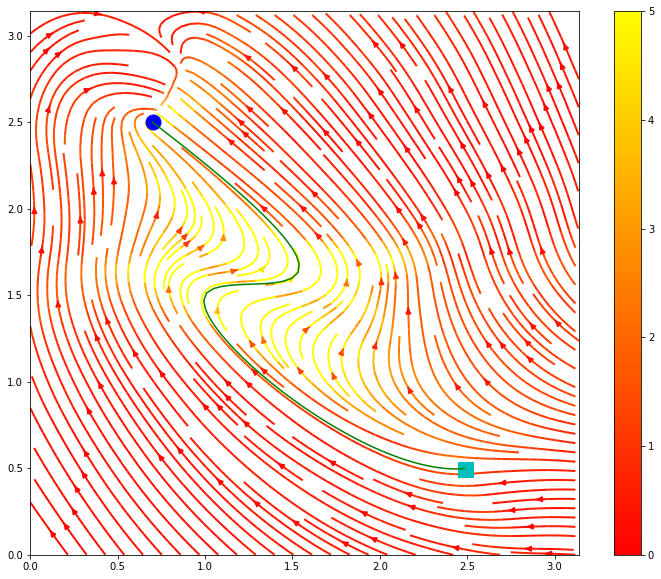

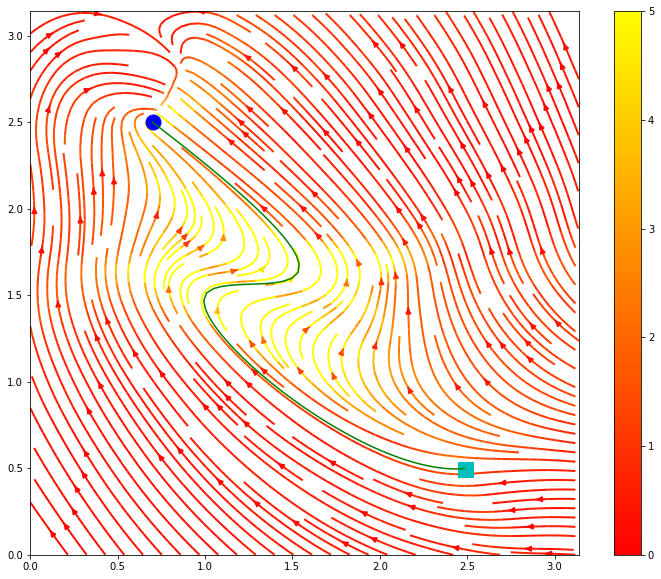

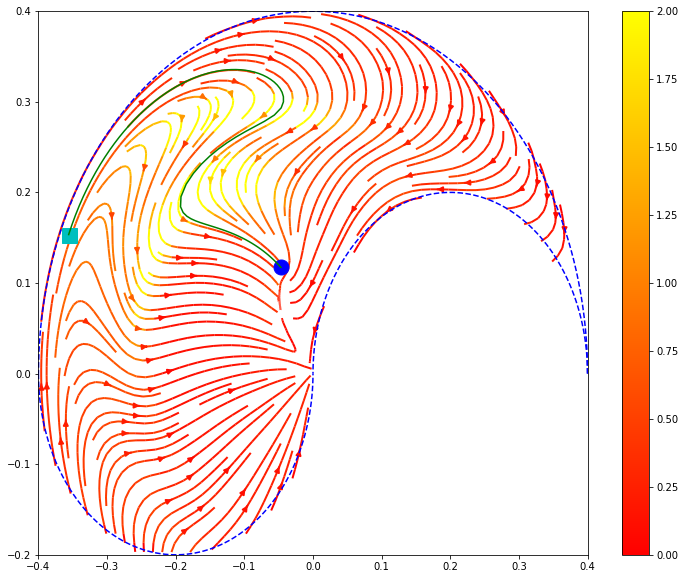

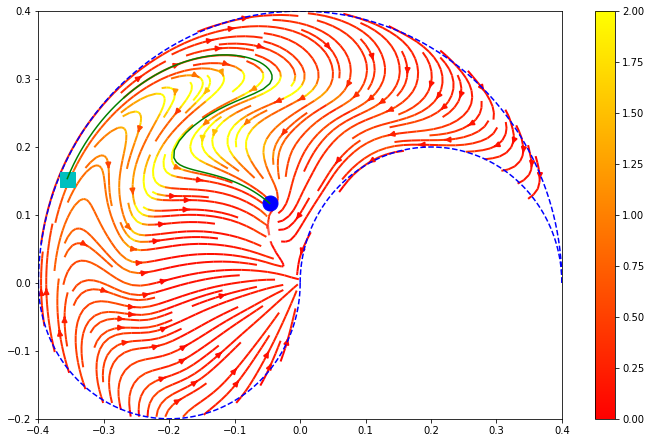

In [11]:
#mode 0: exp barrier, 1: relu squared
mode = 2
penalty = 50
optim_.optim_Euc_reg(q_in_reg,qtraj ,q_dot,dt,q_in_boundary,q_dot_boundary,penalty,penalty_boundary, learning_rate = 1e-5,epoch=10000, batch_size = 400,penalty_mode = mode)
loss_traj_3, loss_boundary_3, loss_Euc_3, loss_kinematic_3, loss_kinetic_3 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_3, loss_boundary_3, loss_Euc_3, loss_kinematic_3, loss_kinetic_3)
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Euclidean Regularization'])
wr.writerow(['loss_traj_3', 'loss_boundary_3', 'loss_Euc_3', 'loss_kinematic_3', 'loss_kinetic_3'])
wr.writerow([loss_traj_3.data.to(device_c).numpy(), loss_boundary_3.data.to(device_c).numpy(), loss_Euc_3.data.to(device_c).numpy(), loss_kinematic_3.data.to(device_c).numpy(), loss_kinetic_3.data.to(device_c).numpy()])
f.close()
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_Eucreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f('fplot_Eucreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)

 i = 10000, loss = 11.541618, total_loss = 11.595836, loss_b = 1.4790242, loss_t = 6.252466e-05, loss_reg = 0.025566211, loss_reg_total =  0.079636134           ....                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

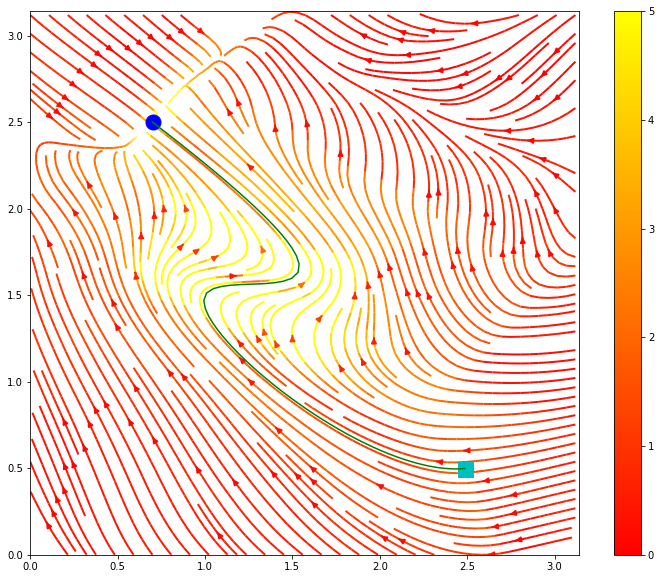

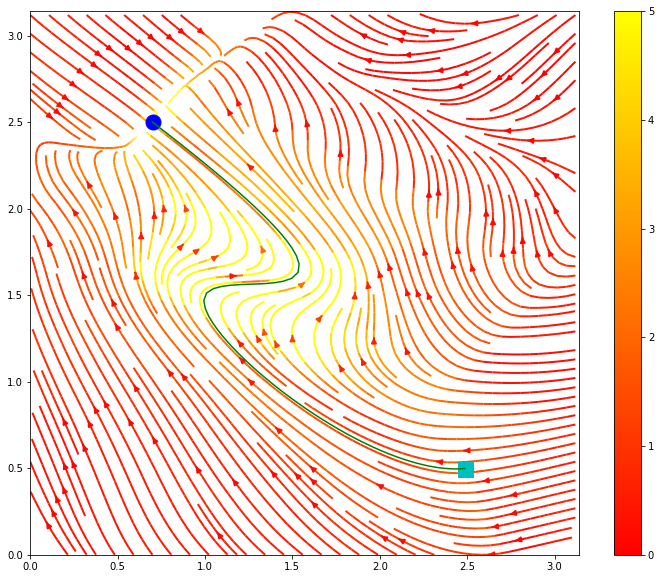

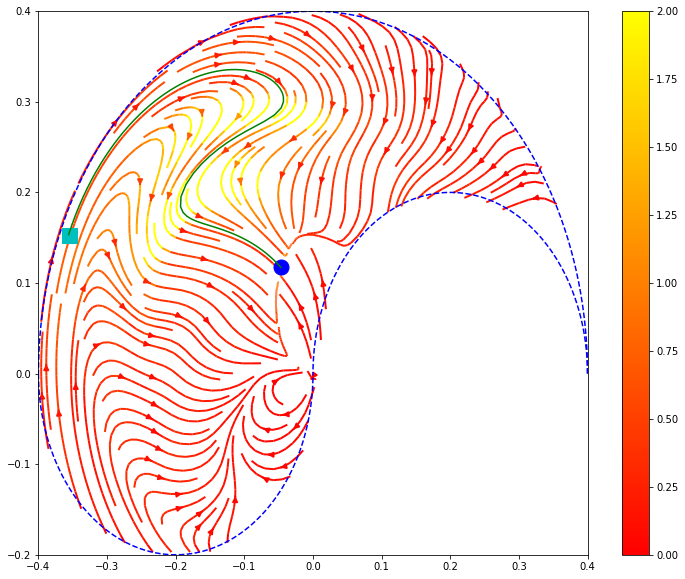

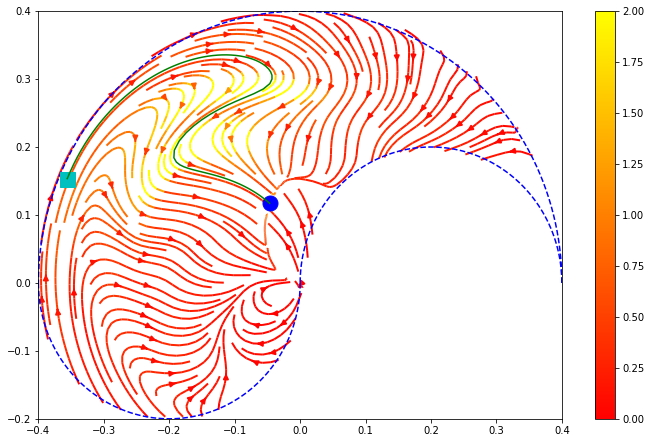

In [13]:
penalty = 10
penalty_boundary = 0
mode = 2
optim_.optim_Kinematic_reg(robot, q_in_reg,qtraj ,q_dot,dt,q_in_boundary,q_dot_boundary,penalty,penalty_boundary, Xstable,alpha_kinematic, learning_rate = 3e-6,epoch=10000, batch_size = 64,penalty_mode = mode)
loss_traj_4, loss_boundary_4, loss_Euc_4, loss_kinematic_4, loss_kinetic_4 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_4, loss_boundary_4, loss_Euc_4, loss_kinematic_4, loss_kinetic_4)
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Kinematic Regularizatio'])
wr.writerow(['loss_traj_4', 'loss_boundary_4', 'loss_Euc_4', 'loss_kinematic_4', 'loss_kinetic_4'])
wr.writerow([loss_traj_4.data.to(device_c).numpy(), loss_boundary_4.data.to(device_c).numpy(), loss_Euc_4.data.to(device_c).numpy(), loss_kinematic_4.data.to(device_c).numpy(), loss_kinetic_4.data.to(device_c).numpy()])
f.close()
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_kinematicreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f('fplot_kinematicreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)

 i = 10000, loss = 11.545146, total_loss = 11.6329, loss_b = 1.8454732, loss_t = 5.9754224e-05, loss_reg = 0.029232115, loss_reg_total =  0.116333105           ....                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

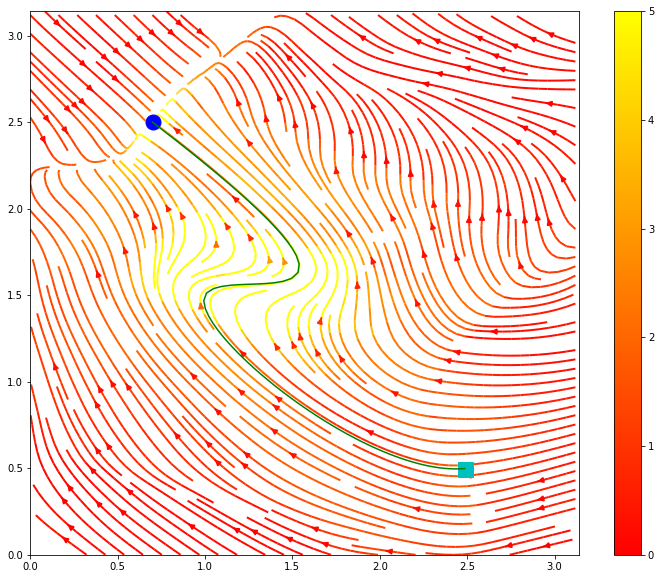

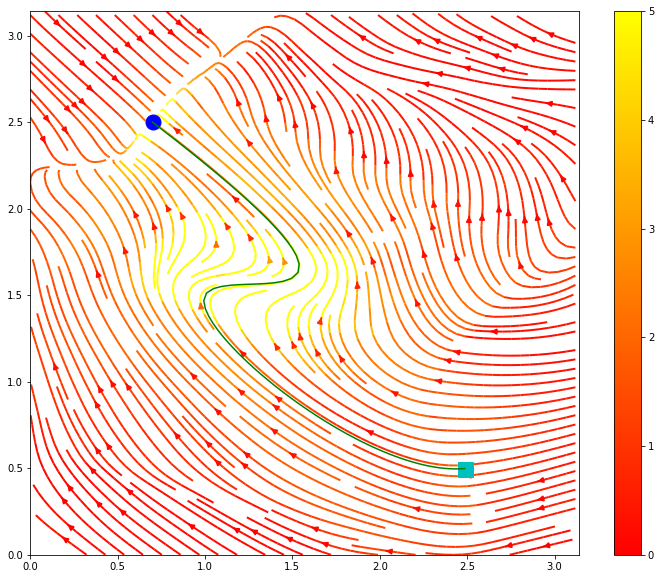

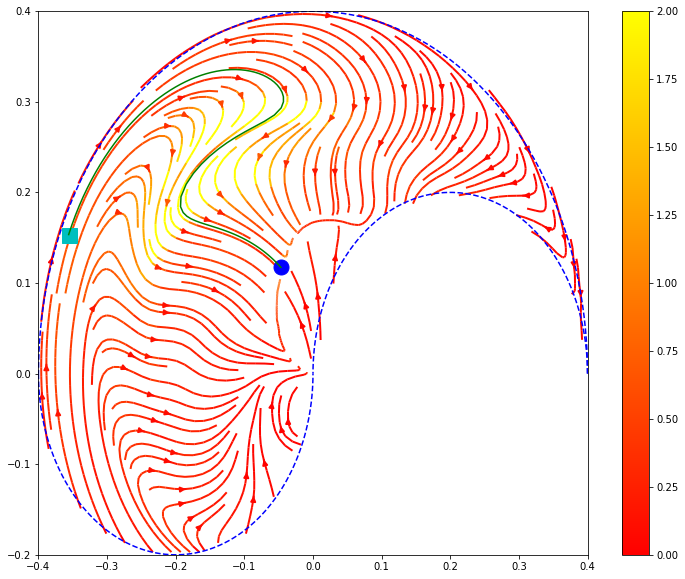

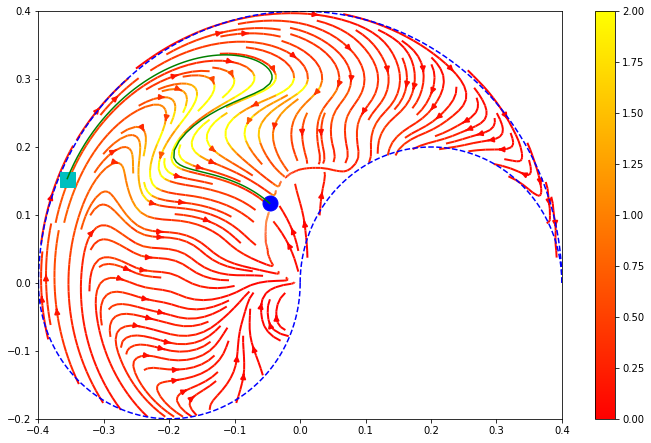

In [14]:
penalty = 10
penalty_boundary = 0
optim_.optim_Kinetic_reg(robot, q_in_reg,qtraj ,q_dot,dt,q_in_boundary,q_dot_boundary,penalty,penalty_boundary, Xstable, learning_rate = 3e-6,epoch=10000, batch_size = 40,penalty_mode = 2)
loss_traj_5, loss_boundary_5, loss_Euc_5, loss_kinematic_5, loss_kinetic_5 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_5, loss_boundary_5, loss_Euc_5, loss_kinematic_5, loss_kinetic_5)
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Kinetic Regularization'])
wr.writerow(['loss_traj_5', 'loss_boundary_5', 'loss_Euc_5', 'loss_kinematic_5', 'loss_kinetic_5'])
wr.writerow([loss_traj_5.data.to(device_c).numpy(), loss_boundary_5.data.to(device_c).numpy(), loss_Euc_5.data.to(device_c).numpy(), loss_kinematic_5.data.to(device_c).numpy(), loss_kinetic_5.data.to(device_c).numpy()])
f.close()
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_kineticreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f('fplot_kineticreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)

# No Regularization

In [3]:
# initialize
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

In [4]:
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000)

NameError: name 'h_2d' is not defined

In [9]:
loss_traj_1, loss_boundary_1, loss_Euc_1, loss_kinematic_1, loss_kinetic_1 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_1, loss_boundary_1, loss_Euc_1, loss_kinematic_1, loss_kinetic_1)

#1 done
#2 done
#3 done
#4 done
#5 done
tensor(0.0017, device='cuda:0') tensor(16.0893, device='cuda:0', grad_fn=<MulBackward0>) tensor(3016.0620) tensor(4.5820, device='cuda:0') tensor(8.2764, device='cuda:0')


In [10]:
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['No Regularization'])
wr.writerow(['loss_traj_1', 'loss_boundary_1', 'loss_Euc_1', 'loss_kinematic_1', 'loss_kinetic_1'])
wr.writerow([loss_traj_1.data.to(device_c).numpy(), loss_boundary_1.data.to(device_c).numpy(), loss_Euc_1.data.to(device_c).numpy(), loss_kinematic_1.data.to(device_c).numpy(), loss_kinetic_1.data.to(device_c).numpy()])
f.close()

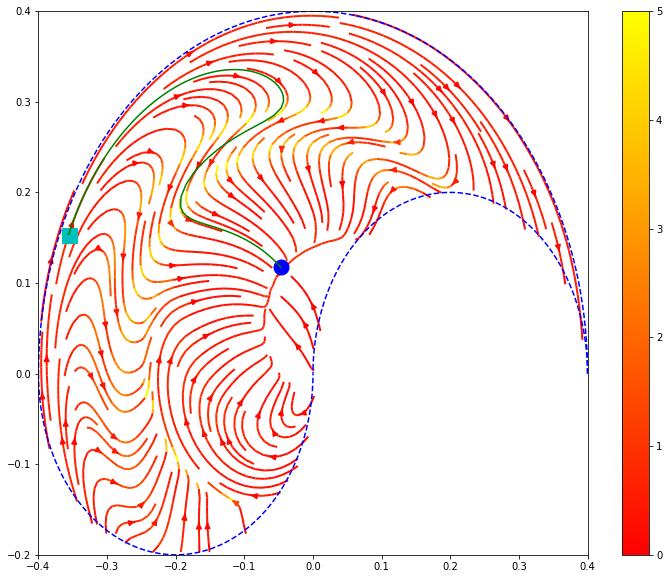

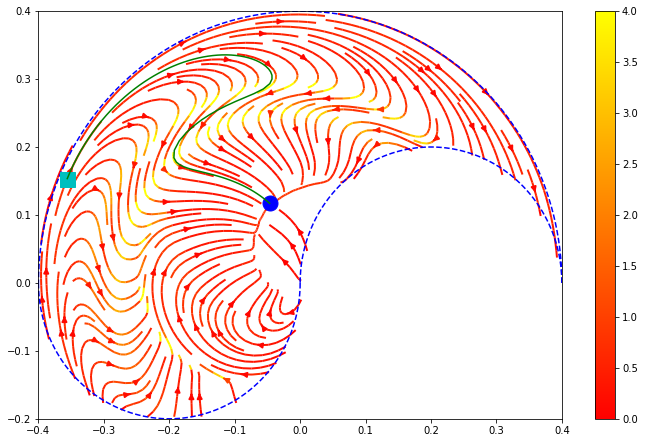

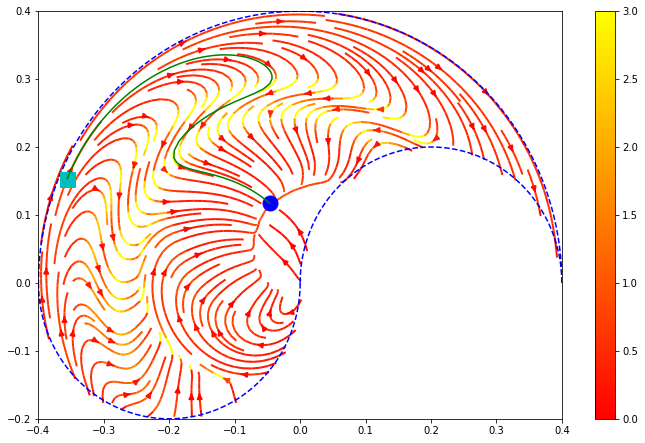

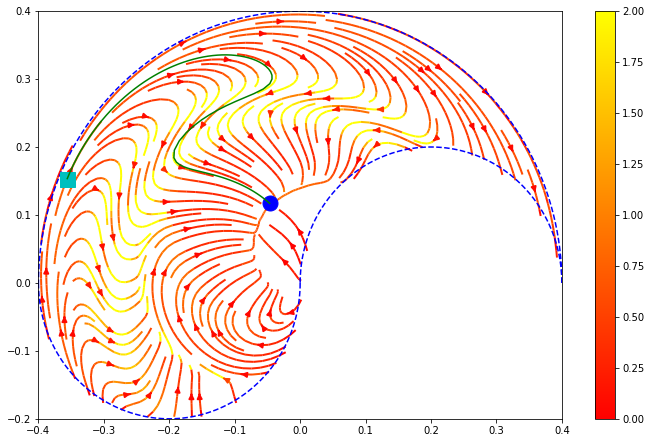

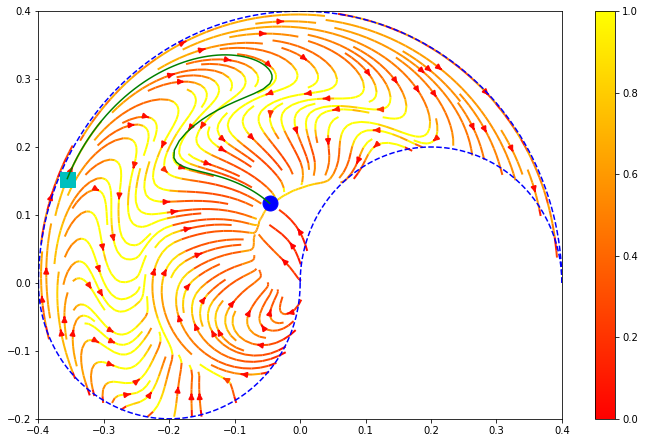

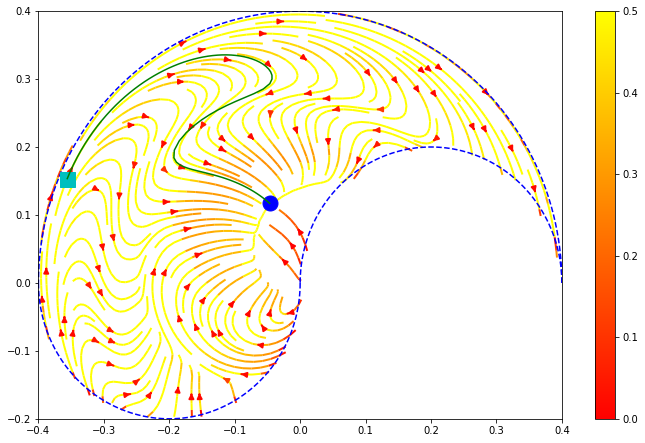

In [140]:
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_5.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_4.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=4)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_3.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=3)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_1.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=1)
plt_.plot_f_taskspace('task_plot_noreg_'+date+'_05.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=.5)

## weight norm decay

In [53]:
# initialization
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

In [18]:
#no regularization
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000)

 epoch = 2777, loss = 0.00047899218, loss_b = 1.4950919, loss_t = 0.00047899218                    ..                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

KeyboardInterrupt: 

In [13]:
#####################################################################
#weight regularization
optim_.optim_weight_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000,weight_decay = 1e-4)

 epoch = 10000, loss = 0.003918794, loss_b = 1.571767, loss_t = 0.003918794                    . . .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

In [14]:
loss_traj_2, loss_boundary_2, loss_Euc_2, loss_kinematic_2, loss_kinetic_2 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_2, loss_boundary_2, loss_Euc_2, loss_kinematic_2, loss_kinetic_2)

#1 done
#2 done
#3 done
#4 done
#5 done
tensor(0.0567, device='cuda:0') tensor(15.5542, device='cuda:0', grad_fn=<MulBackward0>) tensor(1043.4141) tensor(3.6204, device='cuda:0') tensor(6.7062, device='cuda:0')


In [15]:
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Weight Regularization'])
wr.writerow(['loss_traj_2', 'loss_boundary_2', 'loss_Euc_2', 'loss_kinematic_2', 'loss_kinetic_2'])
wr.writerow([loss_traj_2.data.to(device_c).numpy(), loss_boundary_2.data.to(device_c).numpy(), loss_Euc_2.data.to(device_c).numpy(), loss_kinematic_2.data.to(device_c).numpy(), loss_kinetic_2.data.to(device_c).numpy()])
f.close()

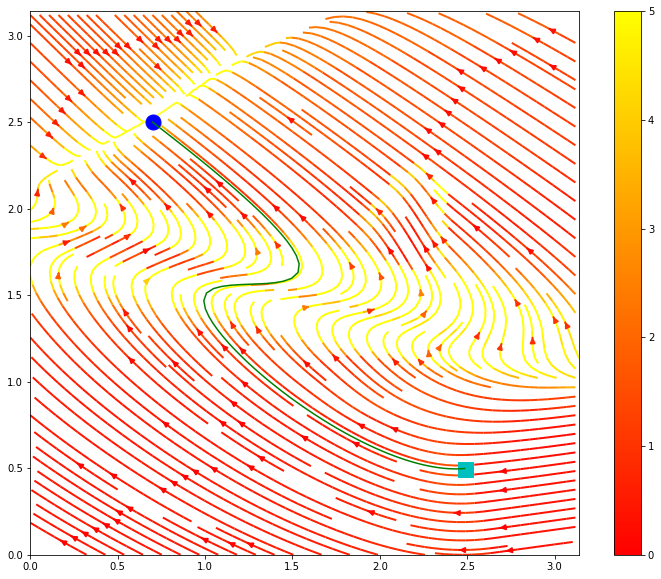

In [16]:
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_wreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)

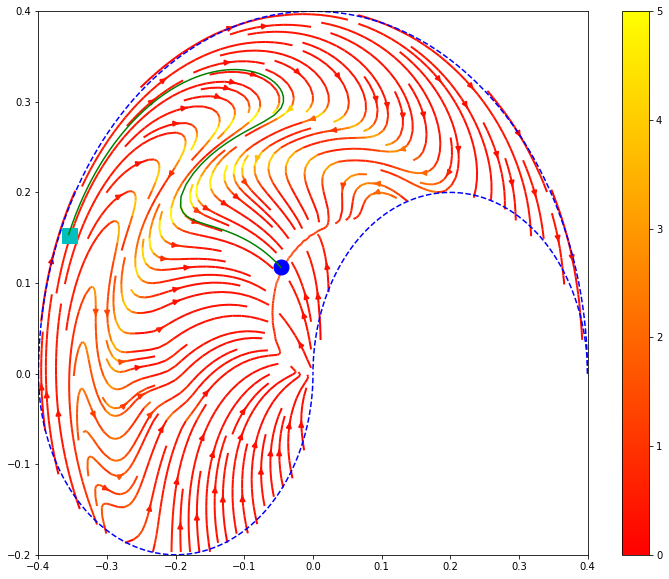

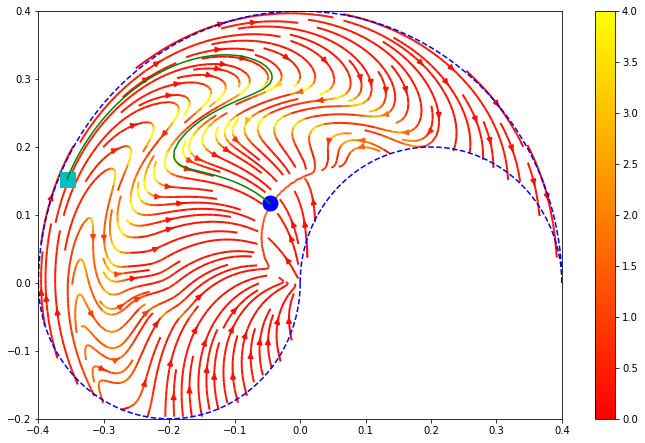

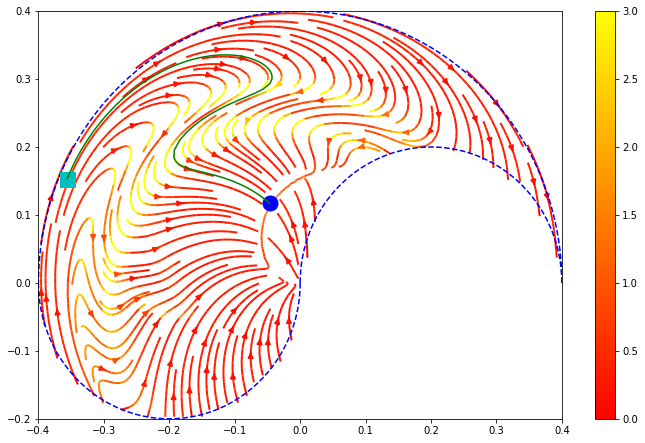

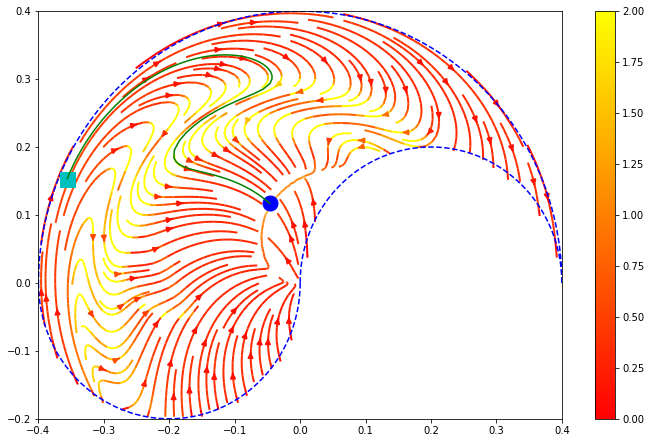

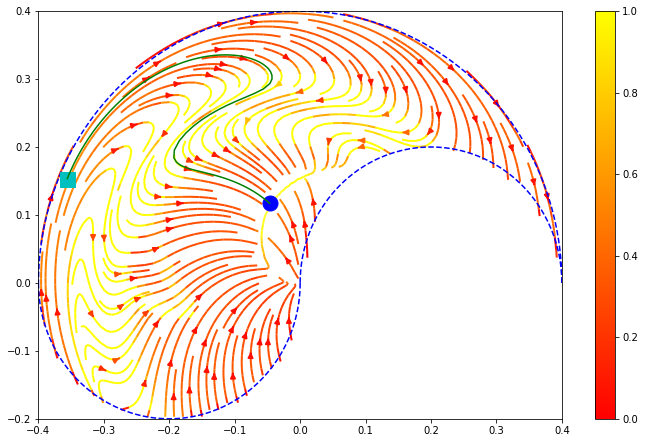

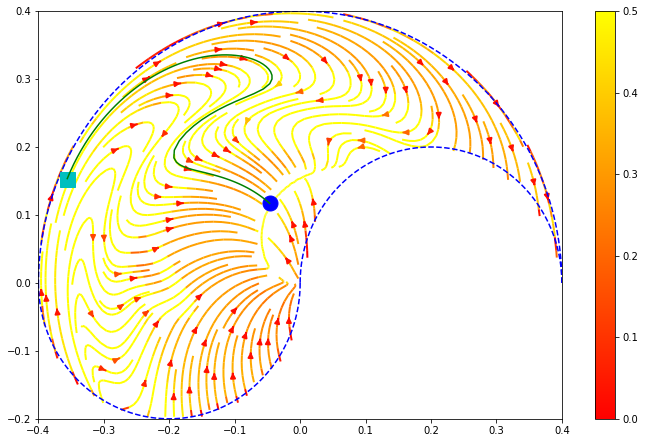

In [17]:
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_5.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_4.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=4)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_3.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=3)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_1.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=1)
plt_.plot_f_taskspace('task_plot_wreg_'+date+'_05.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=.5)

# Euclidean Regularization

In [10]:
# initialization
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

In [11]:
#no regularization
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000)

 epoch = 9233, loss = 0.0005495005, loss_b = 1.6633934, loss_t = 0.0005495005                    . .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

KeyboardInterrupt: 

In [9]:
#####################################################################
#weight regularization
optim_.optim_weight_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000,weight_decay = 1e-4)

 epoch = 5323, loss = 0.0002064217, loss_b = 1.2976735, loss_t = 0.0002064217                    . .                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                    

KeyboardInterrupt: 

In [ ]:
#optimization for Euclidean regularizer
#mode 0: exp barrier, 1: relu squared
mode = 2
penalty = 50
optim_.optim_Euc_reg(q_in_reg,qtraj ,q_dot,dt,q_in_boundary,q_dot_boundary,penalty,penalty_boundary, learning_rate = 1e-5,epoch=100000, batch_size = 400,penalty_mode = mode)

 i = 90142, loss = 69.2363, total_loss = 101.40691, loss_t = 0.007030194, loss_reg = 9.849279, loss_reg_total =  41.825336           . .....                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                            

In [ ]:
loss_traj_3, loss_boundary_3, loss_Euc_3, loss_kinematic_3, loss_kinetic_3 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_3, loss_boundary_3, loss_Euc_3, loss_kinematic_3, loss_kinetic_3)

In [ ]:
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Euclidean Regularization'])
wr.writerow(['loss_traj_3', 'loss_boundary_3', 'loss_Euc_3', 'loss_kinematic_3', 'loss_kinetic_3'])
wr.writerow([loss_traj_3.data.to(device_c).numpy(), loss_boundary_3.data.to(device_c).numpy(), loss_Euc_3.data.to(device_c).numpy(), loss_kinematic_3.data.to(device_c).numpy(), loss_kinetic_3.data.to(device_c).numpy()])
f.close()

In [ ]:
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_Eucreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)

In [ ]:
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_5.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_4.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=4)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_3.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=3)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_1.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=1)
plt_.plot_f_taskspace('task_plot_Eucreg_'+date+'_05.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=.5)

# Kinematic Regularization

In [55]:
# initialization
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

In [56]:
#no regularization
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=10000)

 epoch = 953, loss = 0.0009891486, loss_b = 1.4313619, loss_t = 0.0009891486                    ...                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

KeyboardInterrupt: 

In [20]:
#####################################################################
#weight regularization
optim_.optim_weight_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-4 ,epoch=1000,weight_decay = 1e-4)

 epoch = 801, loss = 0.00031313286, loss_b = 0.0, loss_t = 0.00031313286                    .         ..                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

KeyboardInterrupt: 

In [23]:
#optimization for Euclidean regularizer
#mode 0: exp barrier, 1: relu squared

penalty = 10
penalty_boundary = 0
mode = 2
optim_.optim_Kinematic_reg(robot, q_in_reg,qtraj ,q_dot,dt,q_in_boundary,q_dot_boundary,penalty,penalty_boundary, Xstable,alpha_kinematic, learning_rate = 3e-6,epoch=30000, batch_size = 64,penalty_mode = mode)

 i = 30000, loss = nan, total_loss = nan, loss_b = 2.6692746, loss_t = 478172.66, loss_reg = 29.46858, loss_reg_total =  183.81245           .  ...                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

In [24]:
loss_traj_4, loss_boundary_4, loss_Euc_4, loss_kinematic_4, loss_kinetic_4 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_4, loss_boundary_4, loss_Euc_4, loss_kinematic_4, loss_kinetic_4)

#1 done
#2 done
#3 done
#4 done
#5 done
tensor(4282423., device='cuda:0') tensor(27.7613, device='cuda:0', grad_fn=<MulBackward0>) tensor(65645120.) tensor(957.3865, device='cuda:0') tensor(2601.8772, device='cuda:0')


In [25]:
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Kinematic Regularizatio'])
wr.writerow(['loss_traj_4', 'loss_boundary_4', 'loss_Euc_4', 'loss_kinematic_4', 'loss_kinetic_4'])
wr.writerow([loss_traj_4.data.to(device_c).numpy(), loss_boundary_4.data.to(device_c).numpy(), loss_Euc_4.data.to(device_c).numpy(), loss_kinematic_4.data.to(device_c).numpy(), loss_kinetic_4.data.to(device_c).numpy()])
f.close()

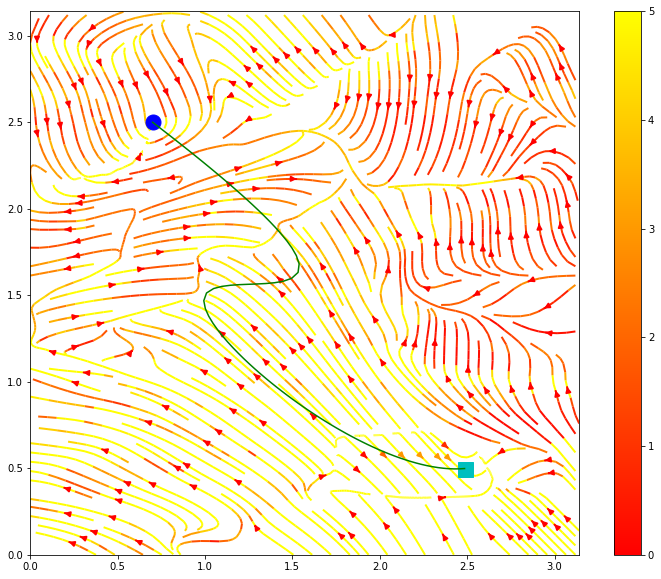

In [26]:
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_kinematicreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)

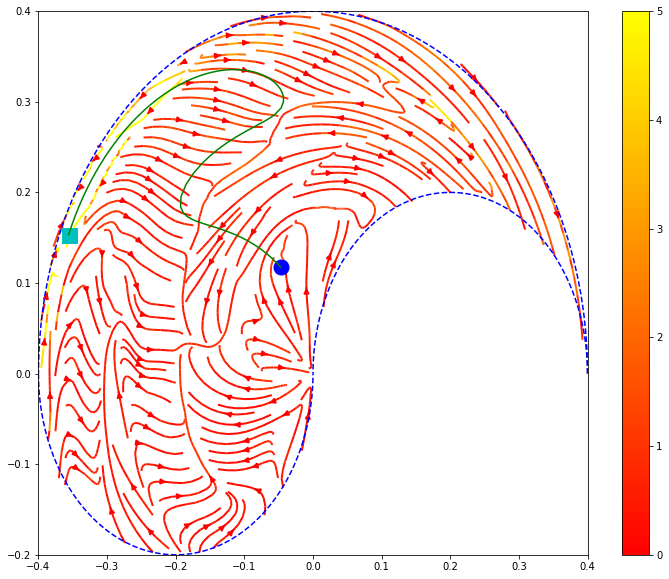

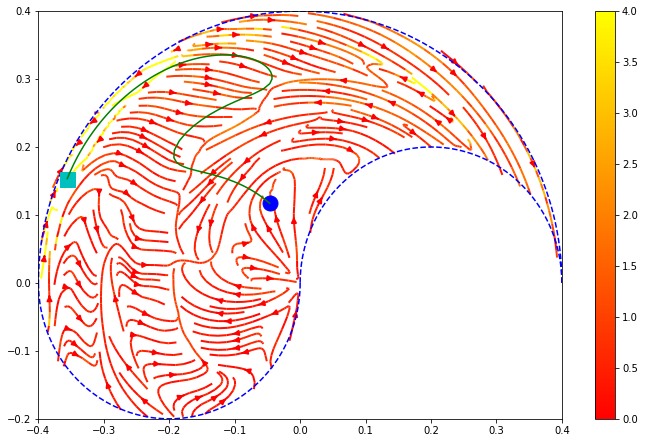

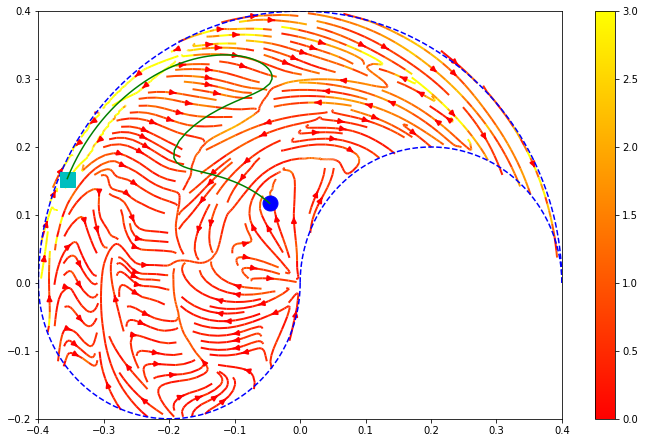

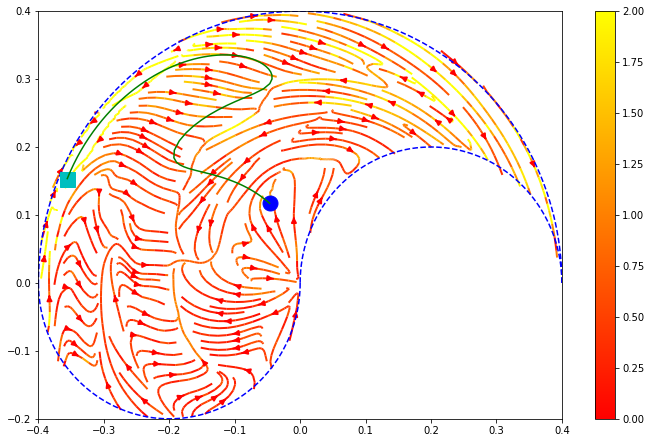

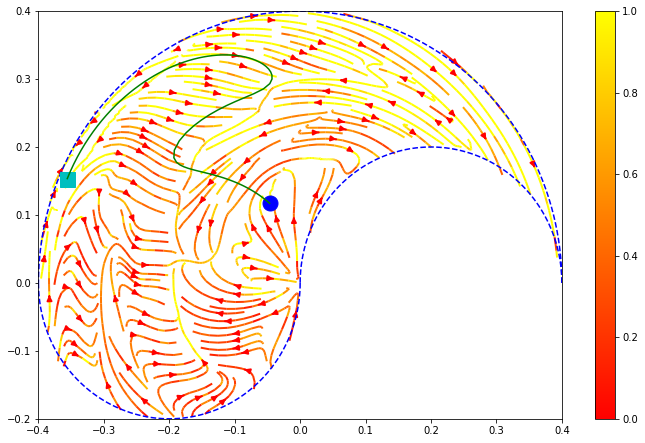

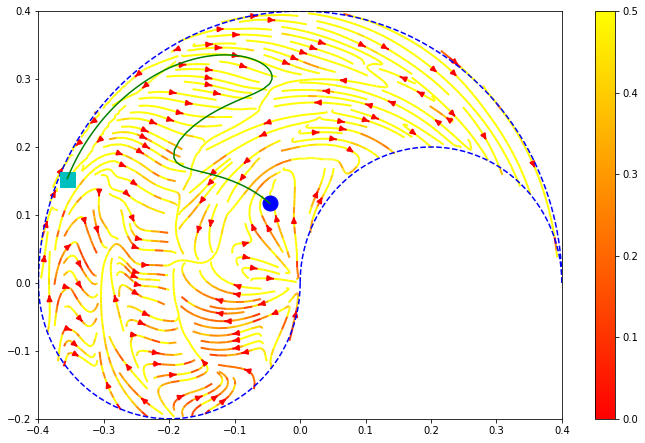

In [27]:
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_5.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_4.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=4)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_3.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=3)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_1.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=1)
plt_.plot_f_taskspace('task_plot_kinematicreg_'+date+'_05.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=.5)

# Kinetic Regularization

In [45]:
# initialization
optim_ = opt.ICNN_optim(V_hidden_sizes, fhat_hidden_sizes,tol,alpha,Xstable,device,T)
q_in_reg,q1,q2 = optim_.get_grid(nq1,nq2,qmin,qmax)

In [46]:
#no regularization
optim_.optim_no_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 4e-4 ,epoch=10000)

 epoch = 975, loss = 0.0012405277, loss_b = 2.3193538, loss_t = 0.0012405277                    ...                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     

KeyboardInterrupt: 

In [27]:
#####################################################################
#weight regularization
optim_.optim_weight_reg(qtraj,q_dot,dt,q_in_boundary,q_dot_boundary, learning_rate = 1e-3 ,epoch=10000,weight_decay = 1e-4)

 epoch = 1145, loss = 0.0002940032, loss_b = 0.0, loss_t = 0.0002940032                    . .     .....                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                

KeyboardInterrupt: 

In [28]:
#optimization for Euclidean regularizer
#mode 0: exp barrier, 1: relu squared
penalty = 10
penalty_boundary = 0
optim_.optim_Kinetic_reg(robot, q_in_reg,qtraj ,q_dot,dt,q_in_boundary,q_dot_boundary,penalty,penalty_boundary, Xstable, learning_rate = 3e-6,epoch=150000, batch_size = 40,penalty_mode = 2)

 i = 8738, loss = nan, total_loss = nan, loss_b = 3.305791, loss_t = 1869538.8, loss_reg = 0.016519455, loss_reg_total =  2494.8545           ...                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

KeyboardInterrupt: 

In [ ]:
loss_traj_5, loss_boundary_5, loss_Euc_5, loss_kinematic_5, loss_kinetic_5 = optim_.performance_metric(robot, q_in_reg, qtraj, q_dot,dt,q_in_boundary,q_dot_boundary, Xstable,alpha_kinematic)
print(loss_traj_5, loss_boundary_5, loss_Euc_5, loss_kinematic_5, loss_kinetic_5)

In [ ]:
f = open(date+'_total_data.csv','a', newline='')
wr = csv.writer(f)
wr.writerow(['Kinetic Regularization'])
wr.writerow(['loss_traj_5', 'loss_boundary_5', 'loss_Euc_5', 'loss_kinematic_5', 'loss_kinetic_5'])
wr.writerow([loss_traj_5.data.to(device_c).numpy(), loss_boundary_5.data.to(device_c).numpy(), loss_Euc_5.data.to(device_c).numpy(), loss_kinematic_5.data.to(device_c).numpy(), loss_kinetic_5.data.to(device_c).numpy()])
f.close()

In [ ]:
plt_ = pl.ICNN_plot(optim_.model,qmin,qmax,nq1_p,nq2_p,xmin,xmax,nx1,nx2,Xstable,qtraj,xtraj,l1,l2,device)
plt_.plot_f('fplot_kineticreg_'+date+'.png', 2, .5, 1, quiver = False, streamplot = True,cmax=5)

In [ ]:
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_5.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=5)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_4.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=4)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_3.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=3)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_2.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=2)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_1.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=1)
plt_.plot_f_taskspace('task_plot_kineticreg_'+date+'_05.png', robot, 2,  0.5,  1, quiver = False, streamplot = True,cmax=.5)